# Images and Color
## Duke Kunshan University Fall 2017
### David Brady
Monday 13 November 2017

This is a the second Jupyter Notebook for discussion in class



In [1]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import subprocess
import skimage
import skimage.io as imio
import skimage.transform as trans
from skimage.viewer import ImageViewer
import glob
import re
from time import gmtime, strftime, sleep
from scipy import interpolate as interp
%matplotlib inline
mpl.rcParams['figure.figsize'] = (16.0, 8.0) 

/home/dbrady/anaconda3/lib/python3.6/site-packages/skimage/viewer/utils/core.py:10: UserWarning: Recommended matplotlib backend is `Agg` for full skimage.viewer functionality.
  warn("Recommended matplotlib backend is `Agg` for full "


In [8]:
def grabImage(sid=1, imres=8, fm=1, cameraNumber=6):
    # I will use the file name dbGrab.... for the image grabbed from the camera. First step is to get rid of previously grabbed images
    cmdA='rsh ubuntu@10.0.1.'+str(cameraNumber)
    cmdB='rcp ubuntu@10.0.1.'+str(cameraNumber)
    subprocess.run('rm dbGrab*', \
                   stdout=subprocess.PIPE, shell=True)
    subprocess.run('rm *raw', \
                   stdout=subprocess.PIPE, shell=True)
    subprocess.run(cmdA+' "rm dbGrab*"', \
                   stdout=subprocess.PIPE, shell=True)
    subprocess.run(cmdA+' "rm *.raw"', \
                   stdout=subprocess.PIPE, shell=True)
    # ok, now let's grab an image on the tegra
    cmD=cmdA+' "nvgstcapture-1.0 -m 1 --sensor-id '+str(sid)+' -A --capture-auto 1 --dump-bayer\
                    --file-name dbGrab --image-res '+ str(imres)+'"'
    subprocess.run(cmD, stdout=subprocess.PIPE, shell=True)
    subprocess.run(cmdB+':dbGrab* .', \
                   stdout=subprocess.PIPE, shell=True)
    subprocess.run(cmdB+':*.raw .', \
                   stdout=subprocess.PIPE, shell=True)
    #ok, now let's find the file name of the image we just grabbed and transfered 
    pop=subprocess.run('ls',stdout=subprocess.PIPE, shell=True)
    rePop=pop.stdout
    rePop=rePop.decode("utf-8")
    if fm==1:
        fileName = re.search(r'dbGrab(.*).jpg', rePop)
        fileName=fileName.group()
        pop=imio.imread(fileName)
    else:
        fileName = re.search(r'(.*).raw', rePop)
        fileName=fileName.group()
        pop=np.fromfile(fileName,dtype=np.dtype('i2'))
        pop=pop[28672:]
        pop=np.reshape(pop,(2160,3840))
       # pop=np.append(pop[:,2060:] ,pop[:,:2060],axis=1)
    return pop

In [1]:
def demosaic(rawImage):
    red1=rawImage[1:2161:2,0:2048:2]
    red2=rawImage[0:2160:2,2048:3840:2]
    red=np.append(red2 ,red1,axis=1)
    redU=interp.RectBivariateSpline(np.arange(0,1080),np.arange(0,1920),red)
    red=redU(np.arange(0,1080,.5),np.arange(0,1920,.5))
    blue1=rawImage[0:2160:2,1:2049:2]
    blue2=rawImage[1:2161:2,2049:3841:2]
    blue=np.append(blue2 ,blue1,axis=1)
    blueU=interp.RectBivariateSpline(np.arange(0,1080),np.arange(0,1920),blue)
    blue=blueU(np.arange(0,1080,.5),np.arange(0,1920,.5))
    green=rawImage;
    for er in range(1,2159,2):
        for odr in range(0,2050,2):
            green[er,odr]=np.mean([green[er-1,odr], green[er,odr-1],green[er+1,odr], green[er,odr+1]])
    for er in range(0,2160,2):
        for odr in range(1,2049,2):
            green[er,odr]=np.mean([green[er-1,odr], green[er,odr-1],green[er+1,odr], green[er,odr+1]])
    for er in range(0,2160,2):
        for odr in range(2048,3838,2):
            green[er,odr]=np.mean([green[er-1,odr], green[er,odr-1],green[er+1,odr], green[er,odr+1]])
    for er in range(1,2159,2):
        for odr in range(2047,3839,2):
            green[er,odr]=np.mean([green[er-1,odr], green[er,odr-1],green[er+1,odr], green[er,odr+1]])
    green=np.append(green[:,2048:] ,green[:,:2048],axis=1)
    imageOut=np.dstack((red,green,blue))
    imageOut=255*imageOut/np.max(imageOut)
    imageOut=imageOut.astype(np.uint8)
    return imageOut
            
    

In [90]:
def adjustColor(inputImage,rc=1,bc=1,gc=1,gain=1,contrast=1):
    fI=inputImage.astype(np.float)
    fI[:,:,0]=rc*fI[:,:,0]
    fI[:,:,1]=gc*fI[:,:,1]
    fI[:,:,2]=bc*fI[:,:,2]
    fI=gain*fI/np.max(fI)
    fI=255*np.tanh(contrast*fI)
    fI=fI.astype(np.uint8)
    return fI
    

In [76]:
b=demosaic(a)

In [67]:
b.shape

(2160, 3840, 3)

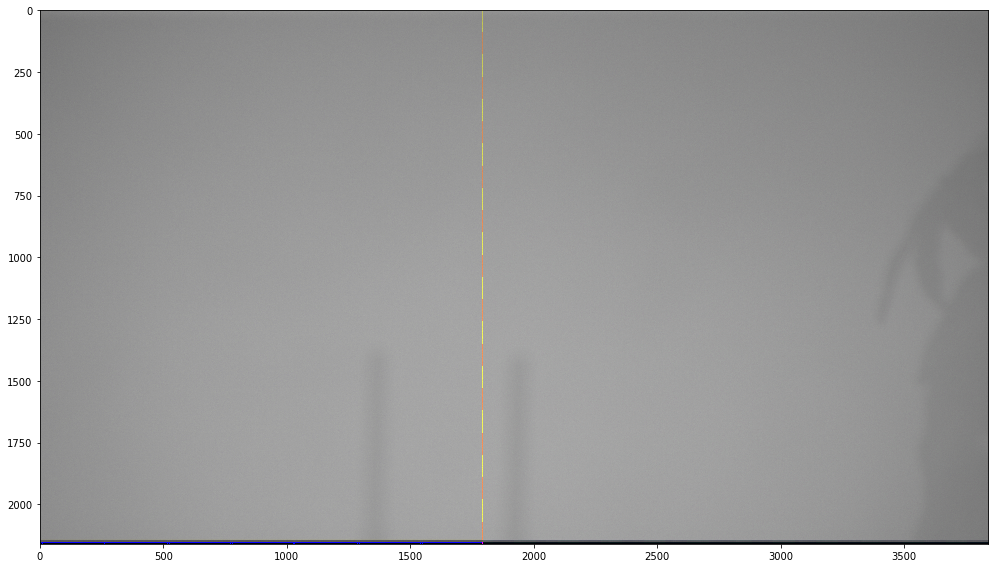

In [78]:
imio.imshow(b)

/home/dbrady/anaconda3/lib/python3.6/site-packages/skimage/io/_plugins/matplotlib_plugin.py:74: UserWarning: Low image data range; displaying image with stretched contrast.
  warn("Low image data range; displaying image with "


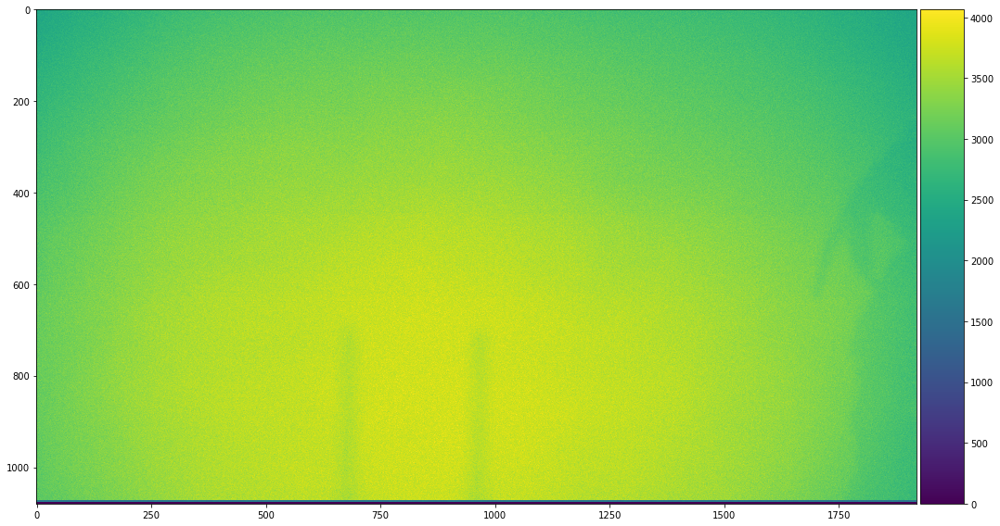

In [63]:
red1=a[1:2161:2,0:2048:2]
red2=a[0:2160:2,2048:3840:2]
red=np.append(red2 ,red1,axis=1)
imio.imshow(red)

In [32]:
red2.shape

(1080, 896)

In [35]:
red=np.append(red2 ,red1,axis=1)

/home/dbrady/anaconda3/lib/python3.6/site-packages/skimage/io/_plugins/matplotlib_plugin.py:74: UserWarning: Low image data range; displaying image with stretched contrast.
  warn("Low image data range; displaying image with "


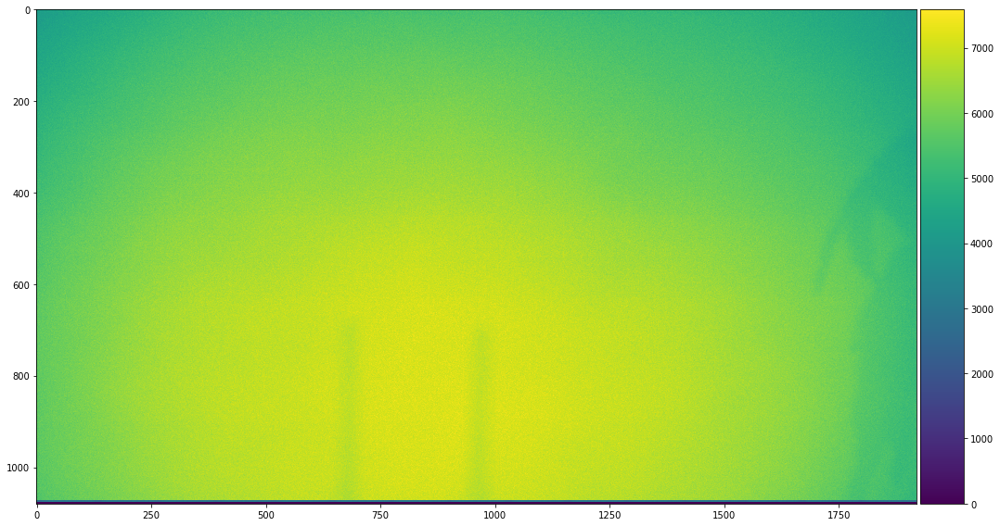

In [37]:
imio.imshow(red)

#looking at a red object
there are two halves to the image plane 
shifting the halves is commented out in the grab image function

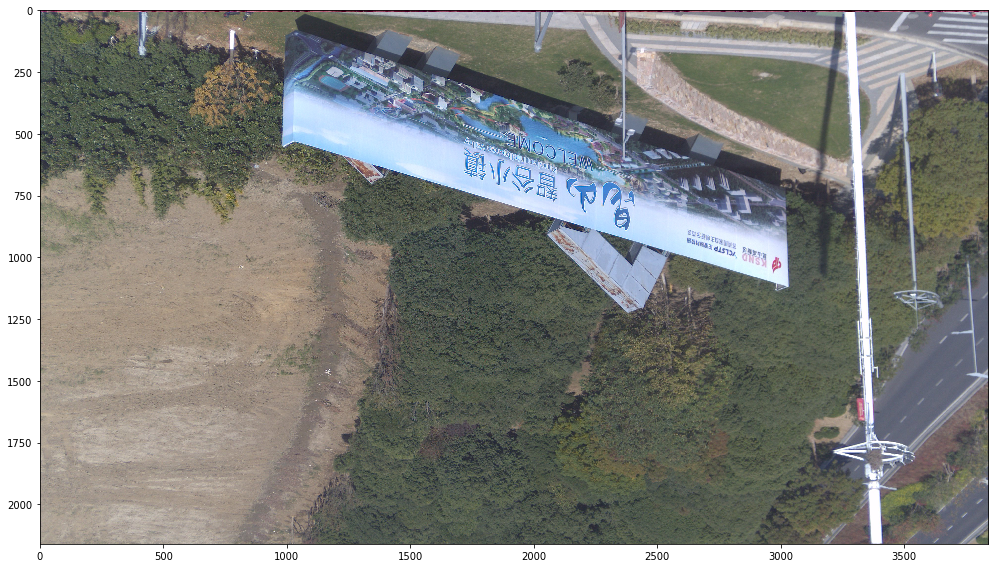

In [79]:
a = grabImage(fm=1)
imio.imshow(a)


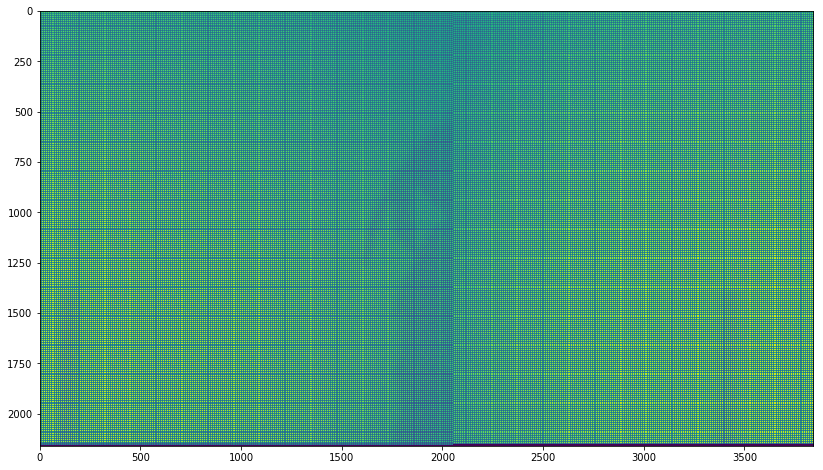

In [54]:
a = grabImage(fm=2)
plt.imshow(a)

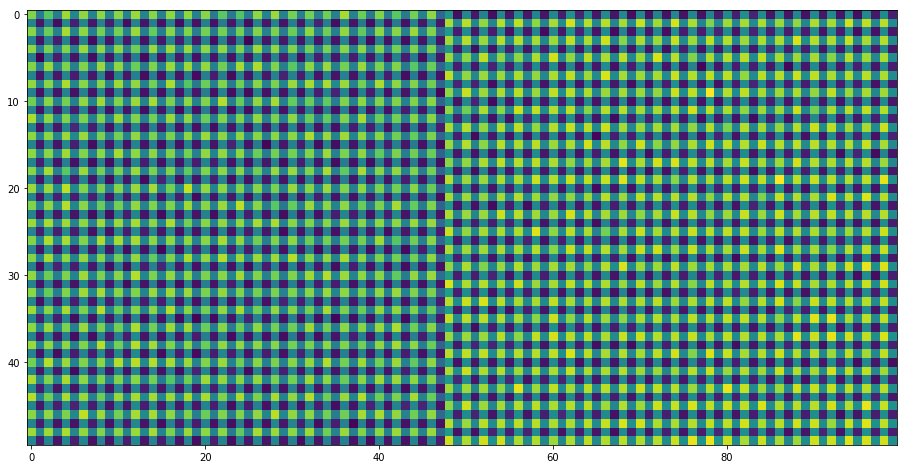

In [61]:
start=353
plt.imshow(a[start:(start+50),2000:2100])

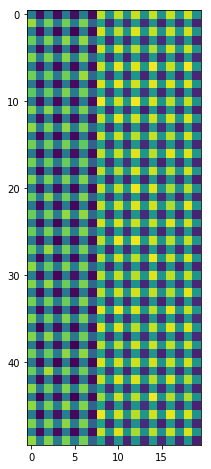

In [62]:
plt.imshow(a[1250:1300,2040:2060])

the break in the two image fields occurs at x= 2046

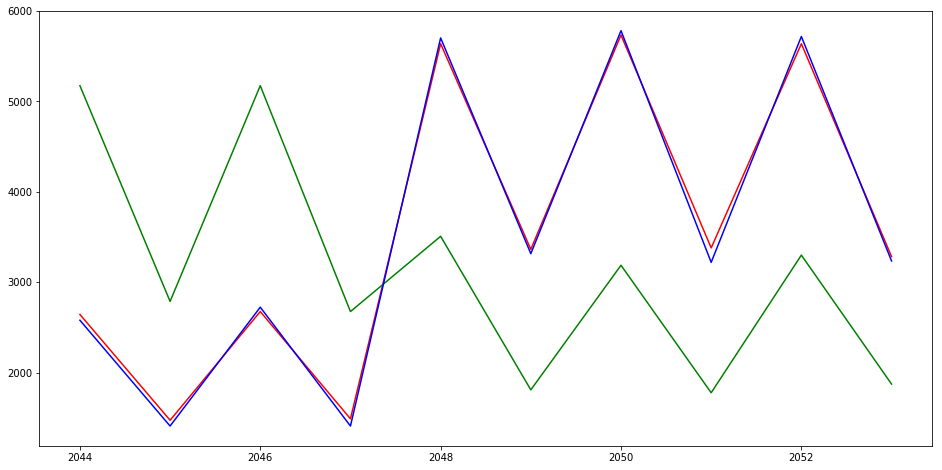

In [20]:
rg=np.arange(2044,2054,1)
plt.plot(rg,a[1250,rg],'r',rg,a[1251,rg],'g',rg,a[1252,rg],'b')

2048 and greater, even rows are red. up to 2047, odd rows are red. red is always in the even columns

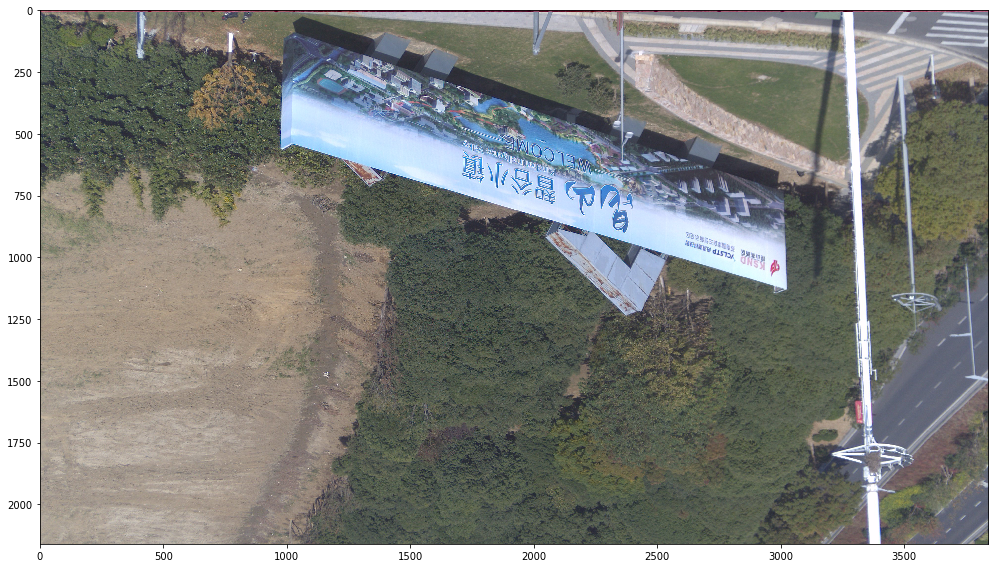

In [80]:
a = grabImage(fm=1)
imio.imshow(a)

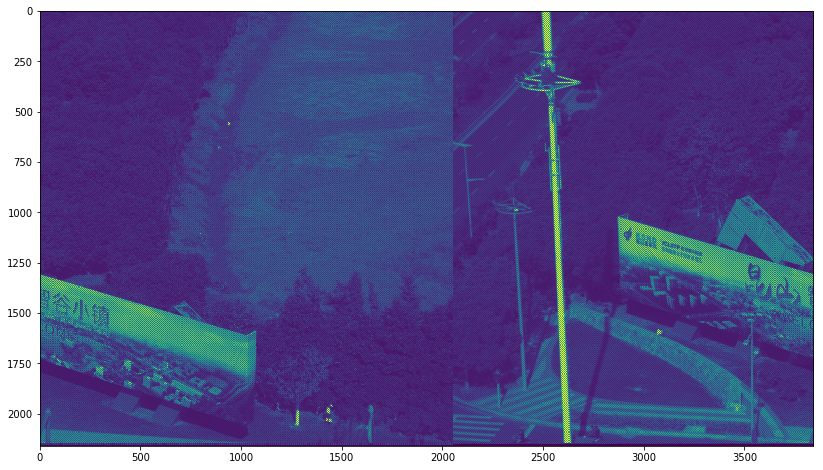

In [81]:
a = grabImage(fm=2)
plt.imshow(a)

In [82]:
b=demosaic(a)

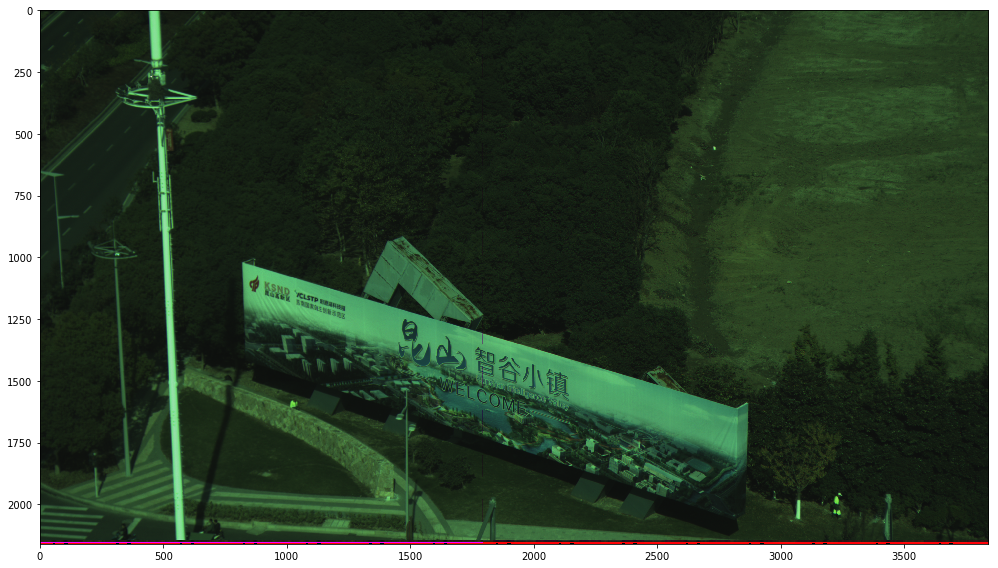

In [83]:
imio.imshow(b)

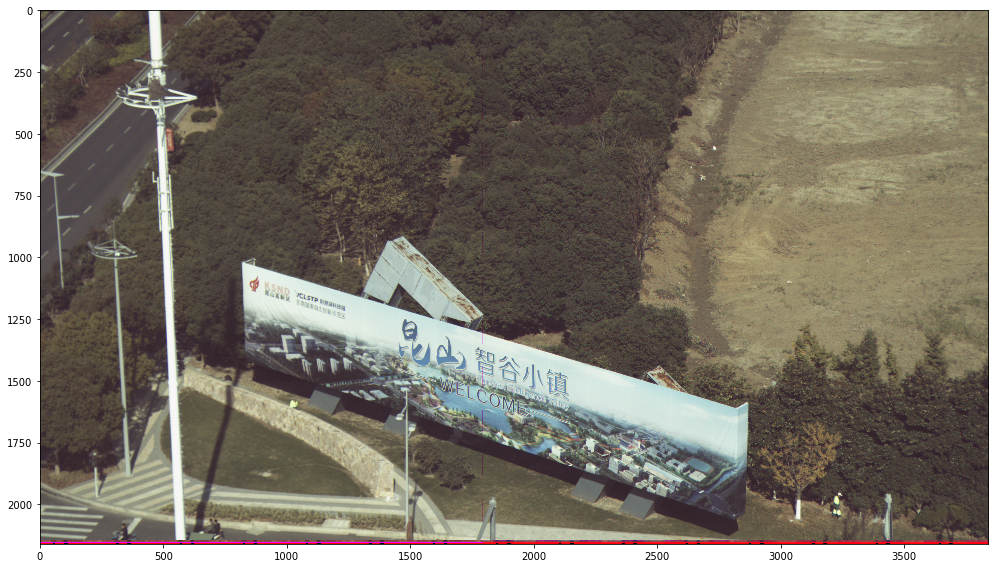

In [92]:
c=adjustColor(b,gc=.7,rc=1.2,gain=4)
imio.imshow(c)

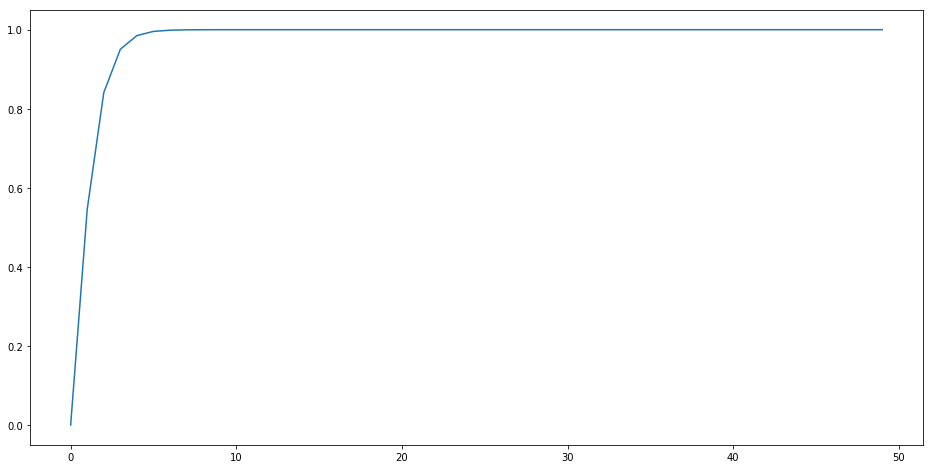

In [89]:
plt.plot(np.tanh(10*np.linspace(0,3,50)))